<a href="https://colab.research.google.com/github/ZZKIM/SmartFarm/blob/main/object_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!curl -L "https://app.roboflow.com/ds/7RrI4yEdi5?key=DlQyIeob0t" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   1556      0 --:--:-- --:--:-- --:--:--  1558
100 24.0M  100 24.0M    0     0  7248k      0  0:00:03  0:00:03 --:--:-- 9394k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/V006_77_0_00_03_03_11_0_c14_20201119_0013_S01_1_jpg.rf.6f40d5fff9153a1cbfb927fa59f85354.jpg  
 extracting: test/images/V006_77_0_00_03_03_11_0_c14_20201119_0014_S01_1_jpg.rf.85e603b7d13045279d4a712bb2f84ff7.jpg  
 extracting: test/images/V006_77_0_00_03_03_11_0_c15_20201119_0003_S01_1_jpg.rf.41964845a22f588f61bf7db5f92d25ac.jpg  
 extracting: test/images/V006_77_0_00_03_03_11_0_c15_20201119_0009_S01_1_jpg.rf.1cb9668e215f792a39615722befa74e9.jpg  
 extracting: test/images/V

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 12440, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 12440 (delta 24), reused 26 (delta 7), pack-reused 12381
Receiving objects: 100% (12440/12440), 12.20 MiB | 31.79 MiB/s, done.
Resolving deltas: 100% (8568/8568), done.


In [ ]:
from glob import glob
train_img_list = glob('/content/train/images/*.jpg')
val_img_list = glob('/content/valid/images/*.jpg')

In [ ]:
with open('/content/train.txt', 'w') as f:
    f.write('\n'.join(train_img_list) + '\n')
with open('/content/valid.txt', 'w') as f:
    f.write('\n'.join(val_img_list) + '\n')

In [ ]:
!python /content/yolov5/train.py --img 416 --batch 8 --epochs 30 --data /content/data.yaml --weights yolov5x.pt --name ggangmin --cfg /content/yolov5/models/yolov5x.yaml

train: weights=yolov5x.pt, cfg=/content/yolov5/models/yolov5x.yaml, data=/content/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=8, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=ggangmin, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-287-g63ba0cb Python-3.7.13 torch-1.11.0+cu113 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0,

In [ ]:
%load_ext tensorboard #텐서보드 사용
%tensorboard --logdir /content/yolov5/runs/

<IPython.core.display.Javascript object>

In [ ]:
!python /content/yolov5/detect.py --weights '/content/yolov5/runs/train/ggangmin2/weights/best.pt' --source '/content/test/images/*.jpg' --img 416 --conf 0.5

detect: weights=['/content/yolov5/runs/train/ggangmin2/weights/best.pt'], source=/content/test/images/*.jpg, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-287-g63ba0cb Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86186872 parameters, 0 gradients
image 1/21 /content/test/images/V006_77_0_00_03_03_11_0_c14_20201119_0013_S01_1_jpg.rf.6f40d5fff9153a1cbfb927fa59f85354.jpg: 416x416 1 Plant-Normal, Done. (0.050s)
image 2/21 /content/test/images/V006_77_0_00_03_03_11_0_c14_20201119_0014_S01_1_jpg.rf.85e603b7d13045279d4a712bb2f84ff7.jpg: 416x416 2 Plant-Normals, Done. (0.050s)

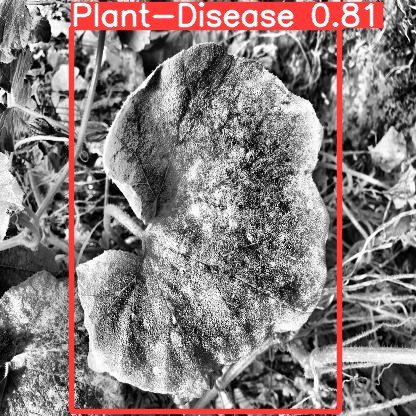

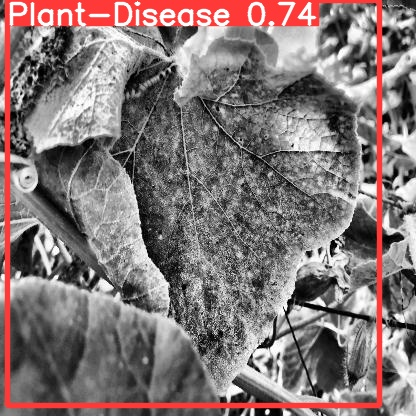

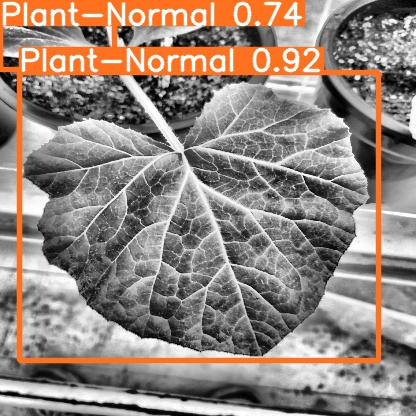

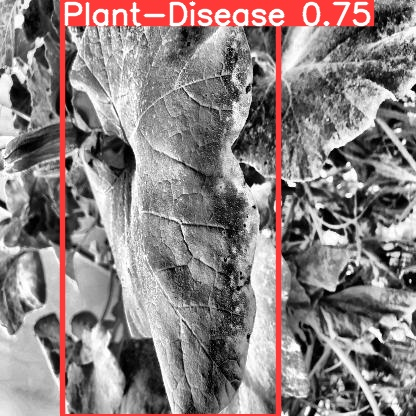

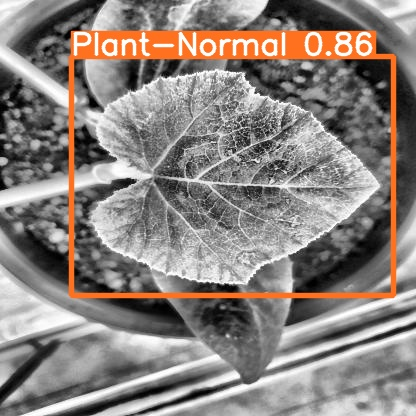

...

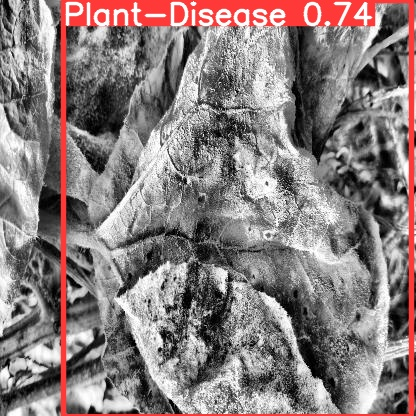

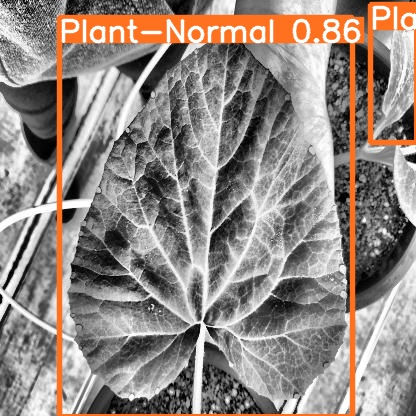

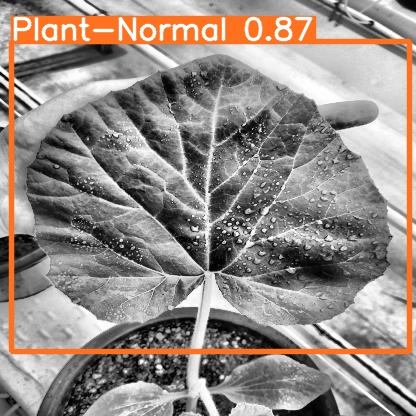

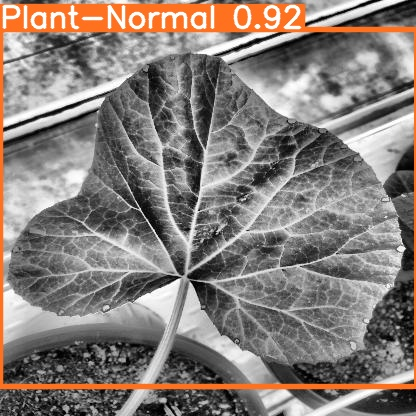

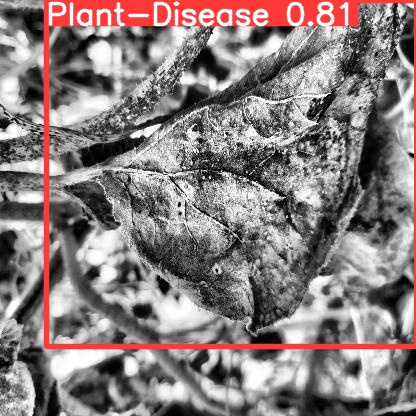

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow

dir = '/content/yolov5/runs/detect/exp3/'

for i in os.listdir(dir):
  path = dir + i

  img_color = cv2.imread(path, cv2.IMREAD_COLOR)

  cv2_imshow(img_color)
  cv2.waitKey(0)

In [ ]:
!cd /content/yolov5/runs/train/ggangmin2
!zip -r /content/disease.zip /content/

	zip warning: name not matched: or
	zip warning: name not matched: nomal.zip
  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2022.07.06/ (stored 0%)
  adding: content/.config/logs/2022.07.06/13.21.33.528230.log (deflated 54%)
  adding: content/.config/logs/2022.07.06/13.20.41.536125.log (deflated 90%)
  adding: content/.config/logs/2022.07.06/13.21.53.919535.log (deflated 55%)
  adding: content/.config/logs/2022.07.06/13.21.54.713715.log (deflated 53%)
  adding: content/.config/logs/2022.07.06/13.21.04.313145.log (deflated 54%)
  adding: content/.config/logs/2022.07.06/13.21.24.463860.log (deflated 86%)
  adding: content/.config/.last_update_check.json (deflated 22%)
  adding: content/.config/.last_opt_in_prompt.yaml (stored 0%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/gce (stored 0

In [ ]:
from google.colab import files
files.download('/content/disease.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>